In [22]:
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from scipy import stats
from sklearn.cluster import KMeans
import folium
import warnings
warnings.filterwarnings('ignore')


api_key = "579b464db66ec23bdd0000014b1fa9a5927f41da518dcd76e072e975"
resource_id = "3b01bcb8-0b14-4abf-b6f2-c1bfd384ba69?api-key=579b464db66ec23bdd000001cdd3946e44ce4aad7209ff7b23ac571b&format=csv" 


url = "https://api.data.gov.in/resource/" + resource_id
params = {
    "api-key": api_key,
    "format": "json",
    "limit": 10000  
}

# Makeing the GET request
response = requests.get(url, params=params)
data = response.json()

# Converting records to DataFrame
df = pd.DataFrame(data['records'])

# Saveing to Excel
df.to_excel("dataset_output.xlsx", index=False)




In [23]:
# Display basic information
print("Initial Dataset Info:")
df.info()
print("\nSample Data:")
print(df.head())

Initial Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3233 entries, 0 to 3232
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   country       3233 non-null   object
 1   state         3233 non-null   object
 2   city          3233 non-null   object
 3   station       3233 non-null   object
 4   last_update   3233 non-null   object
 5   latitude      3233 non-null   object
 6   longitude     3233 non-null   object
 7   pollutant_id  3233 non-null   object
 8   min_value     3233 non-null   object
 9   max_value     3233 non-null   object
 10  avg_value     3233 non-null   object
dtypes: object(11)
memory usage: 278.0+ KB

Sample Data:
  country  state       city                                     station  \
0   India  Bihar    Bettiah            Kamalnath Nagar, Bettiah - BSPCB   
1   India  Bihar  Bhagalpur  DM Office_Kachari Chowk, Bhagalpur - BSPCB   
2   India  Bihar  Bhagalpur                

In [24]:
# ============================
# DATA CLEANING & PREPARATION
# ============================

# Converting numeric columns to float
df['min_value'] = pd.to_numeric(df['min_value'], errors='coerce')
df['max_value'] = pd.to_numeric(df['max_value'], errors='coerce')
df['avg_value'] = pd.to_numeric(df['avg_value'], errors='coerce')
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')


In [25]:
# Checking for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
country           0
state             0
city              0
station           0
last_update       0
latitude          0
longitude         0
pollutant_id      0
min_value       379
max_value       379
avg_value       379
dtype: int64


In [26]:
# Replaceing null values with mean
df['avg_value'].fillna(df['avg_value'].mean(), inplace=True)
df['min_value'].fillna(df['min_value'].mean(), inplace=True)
df['max_value'].fillna(df['max_value'].mean(), inplace=True)

In [27]:
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
country         0
state           0
city            0
station         0
last_update     0
latitude        0
longitude       0
pollutant_id    0
min_value       0
max_value       0
avg_value       0
dtype: int64


In [28]:
# ====================
# EXPLORATORY ANALYSIS
# ====================

# Summary statistics
print("\nSummary Statistics:")
print(df.describe())


Summary Statistics:
          latitude    longitude    min_value    max_value    avg_value
count  3233.000000  3233.000000  3233.000000  3233.000000  3233.000000
mean     22.159266    78.719356    21.264541    71.817099    39.221794
std       5.566991     4.947889    20.778396    81.591367    34.581366
min       8.514909    70.909168     1.000000     1.000000     1.000000
25%      18.993616    75.555917     6.000000    21.000000    13.000000
50%      23.002657    77.482194    18.000000    55.000000    34.000000
75%      26.766433    80.723178    27.000000    83.000000    51.000000
max      34.066206    94.636574   336.000000   500.000000   336.000000


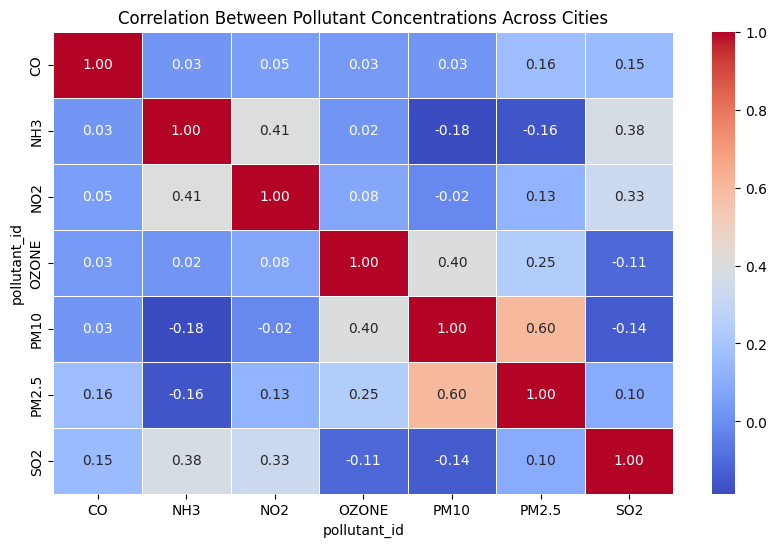

In [29]:
df['avg_value'] = pd.to_numeric(df['avg_value'], errors='coerce')
pivot_df = df.pivot_table(
    index='city',
    columns='pollutant_id',
    values='avg_value',
    aggfunc='mean'
)
pivot_df = pivot_df.dropna(thresh=3)  
correlation_matrix = pivot_df.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Between Pollutant Concentrations Across Cities")
plt.show()

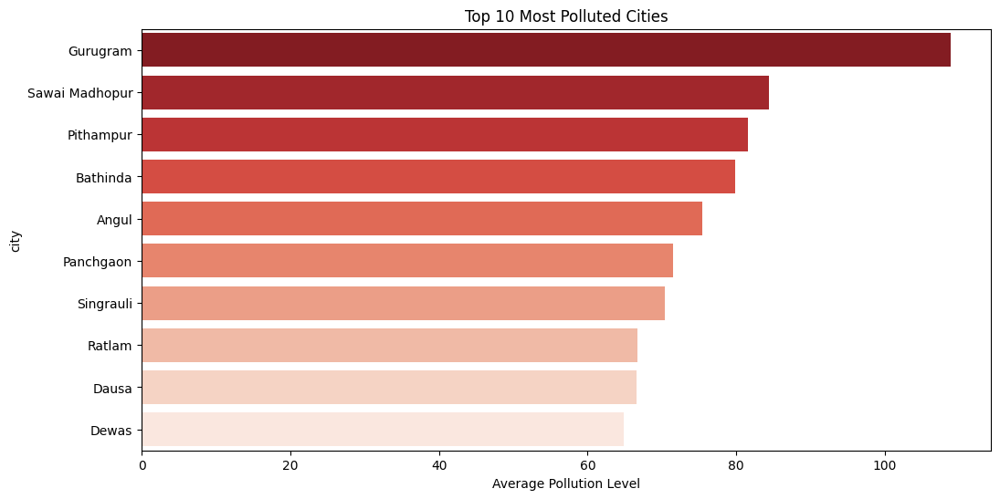

In [32]:
# Top polluted cities
top_cities = df.groupby('city')['avg_value'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cities.values, y=top_cities.index, palette='Reds_r')
plt.title("Top 10 Most Polluted Cities")
plt.xlabel("Average Pollution Level")
plt.show()

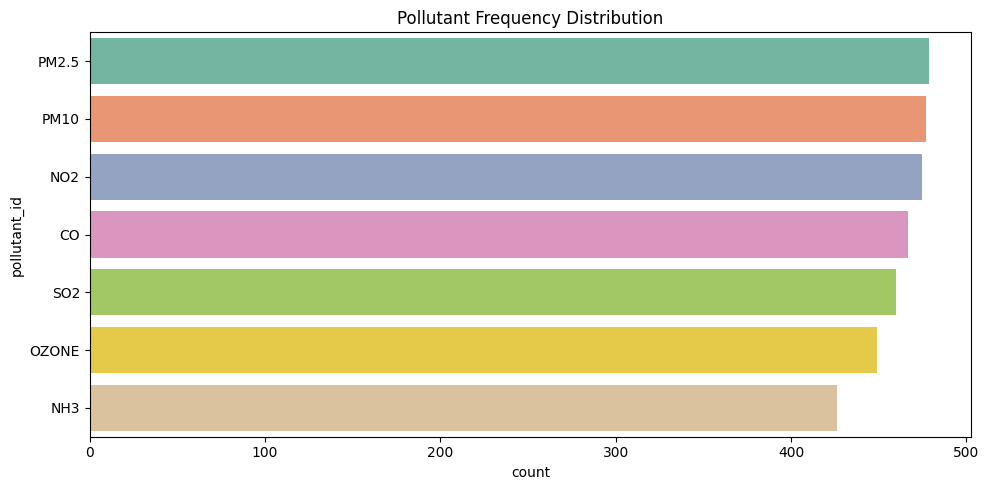

In [10]:
# Pollutant distribution
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='pollutant_id', order=df['pollutant_id'].value_counts().index, palette='Set2')
plt.title("Pollutant Frequency Distribution")
plt.tight_layout()
plt.show()


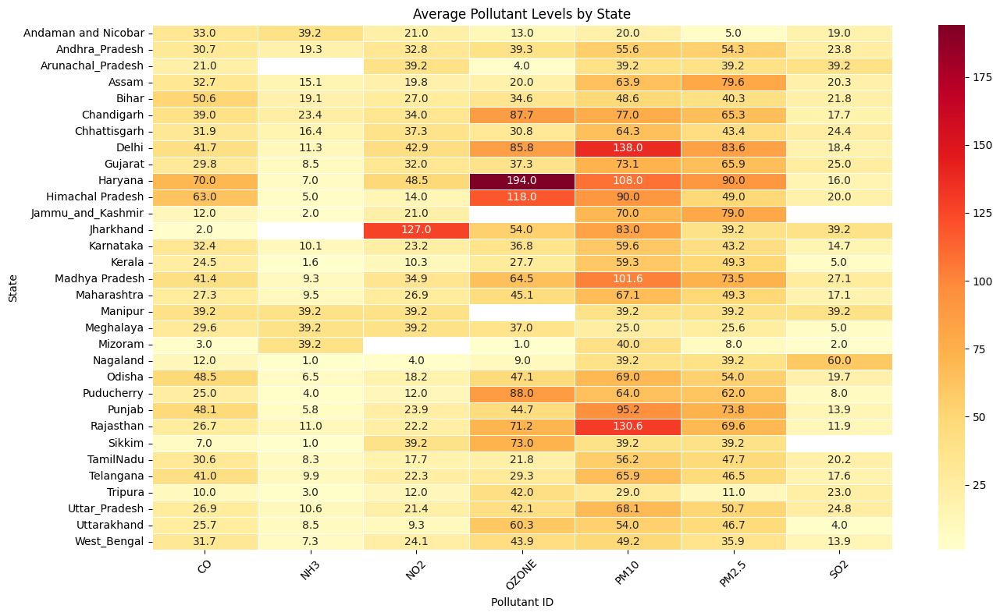

In [11]:
df['avg_value'] = pd.to_numeric(df['avg_value'], errors='coerce')
heatmap_data = df.pivot_table(
    index='state',
    columns='pollutant_id',
    values='avg_value',
    aggfunc='mean'
)
plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="YlOrRd", linewidths=.5)
plt.title("Average Pollutant Levels by State")
plt.ylabel("State")
plt.xlabel("Pollutant ID")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

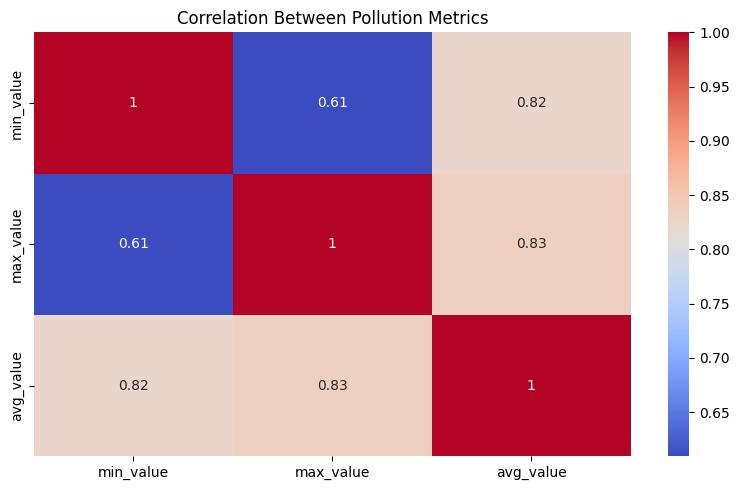

In [12]:
# Correlation Heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(df[['min_value', 'max_value', 'avg_value']].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Between Pollution Metrics")
plt.tight_layout()
plt.show()

In [13]:
# =====================
# STATISTICAL ANALYSIS
# =====================

# Hypothesis test: Compare pollution between two major cities
city1 = 'Delhi'
city2 = 'Mumbai'

data1 = df[df['city'] == city1]['avg_value']
data2 = df[df['city'] == city2]['avg_value']

# Independent t-test
stat, p = stats.ttest_ind(data1, data2, nan_policy='omit')
print(f"\nT-test between {city1} and {city2}:")
print(f"T-statistic: {stat:.2f}, P-value: {p:.4f}")
if p < 0.05:
    print("Result: Significant difference in pollution levels")
else:
    print("Result: No significant difference in pollution levels")



T-test between Delhi and Mumbai:
T-statistic: 8.78, P-value: 0.0000
Result: Significant difference in pollution levels


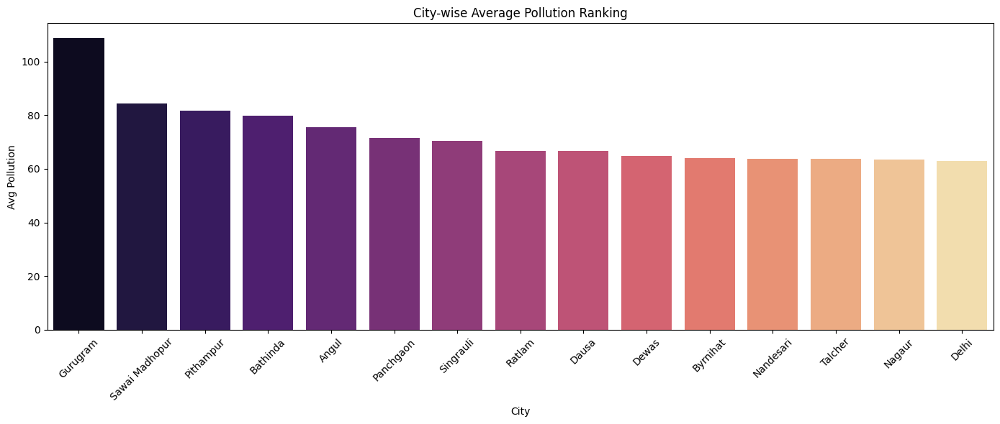

In [14]:
# ================================
# CITY RANKING BY POLLUTION LEVEL
# ================================

pollution_by_city = df.groupby('city')['avg_value'].mean().sort_values(ascending=False)
pollution_by_city = pollution_by_city.reset_index()
pollution_by_city.columns = ['City', 'Avg Pollution']

plt.figure(figsize=(14, 6))
sns.barplot(data=pollution_by_city.head(15), x='City', y='Avg Pollution', palette='magma')
plt.title("City-wise Average Pollution Ranking")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

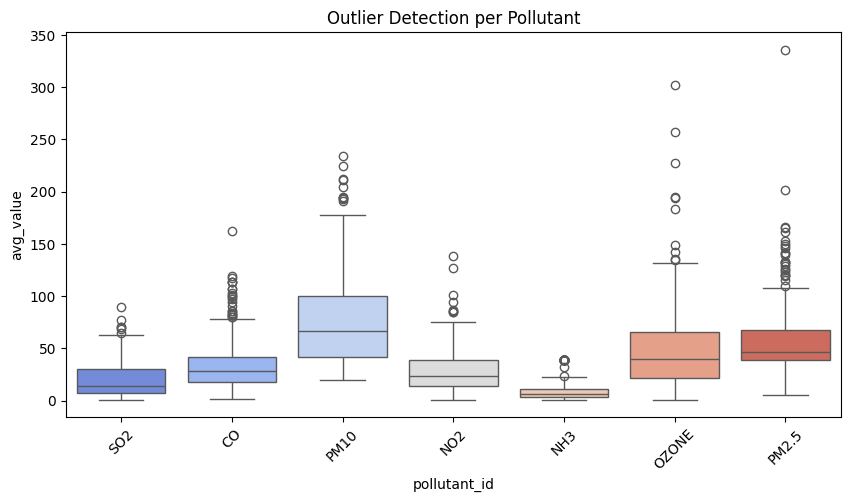

In [15]:
# ===============
# OUTLIER DETECTION AND REMOVAL
# ===============

# Visualize boxplot
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='pollutant_id', y='avg_value', palette='coolwarm')
plt.title("Outlier Detection per Pollutant")
plt.xticks(rotation=45)
plt.show()

# Remove outliers using IQR
Q1 = df['avg_value'].quantile(0.25)
Q3 = df['avg_value'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR
df = df[(df['avg_value'] >= lower) & (df['avg_value'] <= upper)]


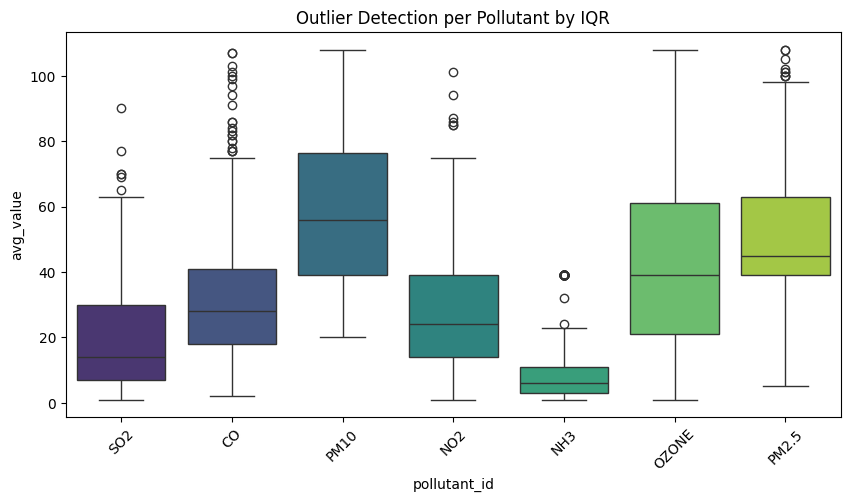

In [16]:
# After Removal of outliers using Iqr method
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='pollutant_id', y='avg_value', palette='viridis')
plt.title("Outlier Detection per Pollutant by IQR")
plt.xticks(rotation=45)
plt.show()

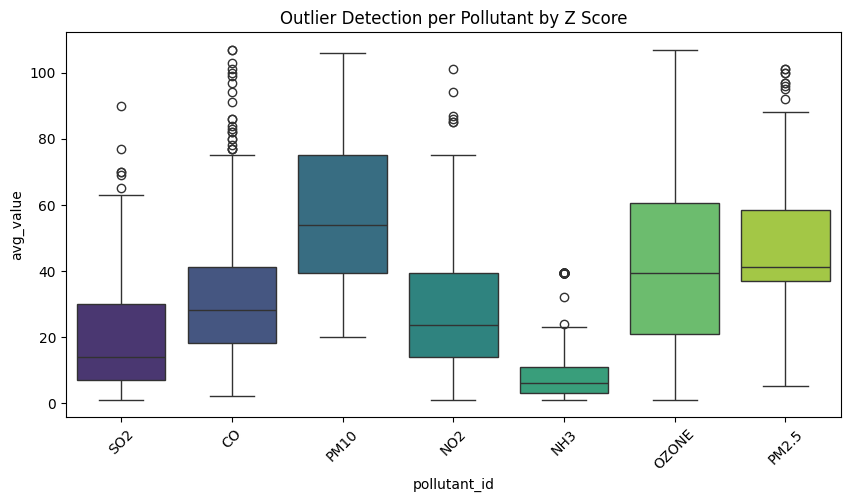

In [17]:
# ---------------------------
# Outlier Detection and Removal (Z-score method)
# ---------------------------

z_scores = np.abs(stats.zscore(df[['max_value']]))
df = df[(z_scores < 3).all(axis=1)]
plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='pollutant_id', y='avg_value', palette='viridis')
plt.title("Outlier Detection per Pollutant by Z Score")
plt.xticks(rotation=45)
plt.show()


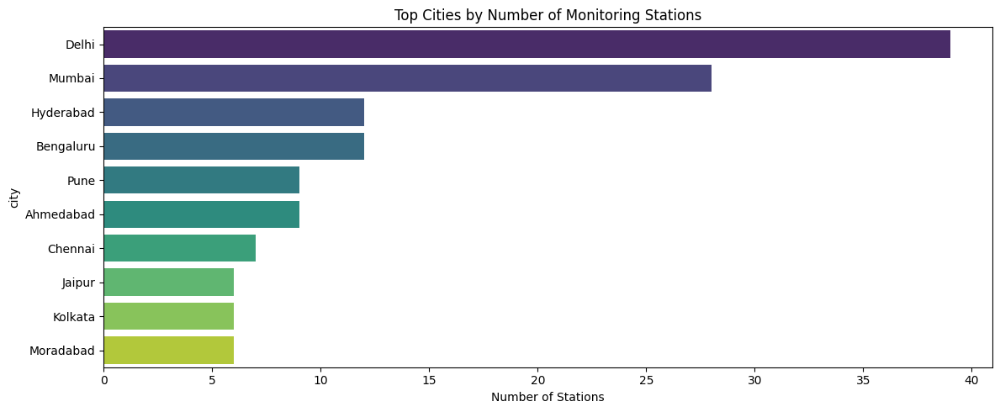

In [18]:
# ======================
# STATION COUNT ANALYSIS
# ======================

station_counts = df.groupby('city')['station'].nunique().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 5))
sns.barplot(x=station_counts.values, y=station_counts.index, palette='viridis')
plt.title("Top Cities by Number of Monitoring Stations")
plt.xlabel("Number of Stations")
plt.tight_layout()
plt.show()

In [33]:
def get_aqi_category_color(value):
    if value <= 50:
        return 'Good', 'green'
    elif value <= 100:
        return 'Satisfactory', 'lightgreen'
    elif value <= 200:
        return 'Moderate', 'yellow'
    elif value <= 300:
        return 'Poor', 'orange'
    elif value <= 400:
        return 'Very Poor', 'red'
    else:
        return 'Severe', 'maroon'

# Apply to DataFrame
df[['AQI_Category', 'AQI_Color']] = df['max_value'].apply(lambda x: pd.Series(get_aqi_category_color(x)))



# ---------------------------
# Plotly Dashboard Components
# ---------------------------

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Prepare category counts for plots
category_order = ['Good', 'Satisfactory', 'Moderate', 'Poor', 'Very Poor', 'Severe']
color_map = {
    'Good': 'green',
    'Satisfactory': 'lightgreen',
    'Moderate': 'yellow',
    'Poor': 'orange',
    'Very Poor': 'red',
    'Severe': 'maroon'
}
df['AQI_Category'] = pd.Categorical(df['AQI_Category'], categories=category_order, ordered=True)
category_counts_df = df['AQI_Category'].value_counts().reindex(category_order).reset_index()
category_counts_df.columns = ['AQI_Category', 'Count']

# Create subplots layout for dashboard
fig = make_subplots(
    rows=3, cols=2,
    specs=[[{"type": "bar"}, {"type": "pie"}],
           [{"type": "box"}, {"type": "domain"}],
           [{"type": "scatter"}, {"type": "bar"}]],
    subplot_titles=("AQI Category Count", "AQI Distribution", "Max Value Box Plot", "Geographical Overview", "Pollutant vs Max Value", "Top Cities by Avg AQI")
)

# Bar Chart
bar_fig = px.bar(
    category_counts_df,
    x='AQI_Category',
    y='Count',
    color='AQI_Category',
    color_discrete_map=color_map
)
for trace in bar_fig.data:
    fig.add_trace(trace, row=1, col=1)

# Pie Chart
pie_trace = go.Pie(
    labels=category_counts_df['AQI_Category'],
    values=category_counts_df['Count'],
    marker=dict(colors=[color_map[cat] for cat in category_counts_df['AQI_Category']]),
    hole=0.3
)
fig.add_trace(pie_trace, row=1, col=2)

# Box Plot
box_fig = px.box(
    df,
    x='AQI_Category',
    y='max_value',
    color='AQI_Category',
    category_orders={'AQI_Category': category_order},
    color_discrete_map=color_map
)
for trace in box_fig.data:
    fig.add_trace(trace, row=2, col=1)

# Sunburst Plot
sunburst_fig = px.sunburst(
    df,
    path=['country', 'state', 'city'],
    values=[1]*len(df),
)
for trace in sunburst_fig.data:
    fig.add_trace(trace, row=2, col=2)

# Scatter Plot: Pollutant vs Max Value
scatter_fig = px.scatter(
    df,
    x='pollutant_id',
    y='max_value',
    color='AQI_Category',
    color_discrete_map=color_map,
    title='Pollutant vs Max AQI Value'
)
for trace in scatter_fig.data:
    fig.add_trace(trace, row=3, col=1)

# Bar Chart: Top 10 Cities by Average AQI
top_cities = df.groupby('city')['max_value'].mean().sort_values(ascending=False).head(10)
top_cities_fig = px.bar(
    top_cities.reset_index(),
    x='city',
    y='max_value',
    color='city',
    title='Top 10 Cities by Avg AQI'
)
for trace in top_cities_fig.data:
    fig.add_trace(trace, row=3, col=2)

# Final layout adjustments
fig.update_layout(
    height=1200,
    width=1400,
    title_text="\U0001F4CA Air Pollution Dashboard ",
    showlegend=False,
    template="plotly_dark"
)
fig.show()

# -------------------------
# Folium Interactive Map
# -------------------------
import folium
from folium.plugins import MarkerCluster
from IPython.display import display

pollution_map = folium.Map(location=[20.5937, 78.9629], zoom_start=5)
marker_cluster = MarkerCluster().add_to(pollution_map)

for _, row in df.iterrows():
    try:
        lat = float(row['latitude'])
        lon = float(row['longitude'])
        category = row['AQI_Category']
        color = row['AQI_Color']
        station = row['station']
        pollutant = row['pollutant_id']
        max_val = row['max_value']

        folium.CircleMarker(
            location=[lat, lon],
            radius=6,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"{station}, {pollutant}: {max_val} ({category})"
        ).add_to(marker_cluster)
    except:
        continue

pollution_map
